In [1]:
import nltk
# nltk.download()
import pandas as pd

In [2]:
data = pd.read_excel("EFTSTUDY16.xlsx", sheet_name='Sheet1')
# data

In [3]:
data.columns

Index(['ID's', 'EFT/ERT', 'AUC EFT/ERT', 'BAUC', 'DELAY', 'IP', 'IP value',
       'cue original', 'cue_spellcheck'],
      dtype='object')

In [4]:
cues = data['cue_spellcheck']
EFT = data['EFT/ERT']
eft_cues = []
ert_cues = []
all_cues = pd.DataFrame(cues)
EFT = pd.DataFrame(EFT)
# all_cues
# EFT

In [5]:
for i in EFT.index:
    if EFT['EFT/ERT'][i] == "EFT":
        eft_cues.append(all_cues['cue_spellcheck'][i])
    else:
        ert_cues.append(all_cues['cue_spellcheck'][i])

In [7]:
eft_cues

['About 2 weeks from now I am visiting my husband in the state prison. I get to talk to him on the phone daily, but I have not gotten to see him in over a year. I am waiting for our tax check and I super excited about seeing him. My son and I are seeing him since we are the only ones allowed. We are driving almost 3 hours to be able to visit him for almost 4 hours.',
 'In 6 months, I am visiting my mother in law. She is down visiting from Indiana. She is staying with us for a week. We have waited for her to come down for a long time because we have not seen her in years. We are ecstatic she is here and is visiting. The kids are excited that they finally get to see her. We are going shopping and doing other fun things while she is here. We are looking forward to all the excitement that happens while she is visiting.',
 'In one year we are picking up my husband from jail. We have waited for this moment for so long. He is being released and he finally gets to come home. My son, daughter, 

In [8]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize, sent_tokenize

### Removing stop words from the cues

In [9]:
stop_words = set(stopwords.words("english"))
print(stop_words)

{'i', 'were', 'd', 'and', "hasn't", 'itself', 'then', 'your', 'hadn', "don't", 'been', 'me', 'under', 'shouldn', 'them', 'having', 'most', 'ours', 'against', 'had', 'themselves', 'myself', "didn't", 'yours', "she's", 'any', 'theirs', 'off', 'aren', 'with', 'more', 'was', 'yourself', 'am', 'his', 'hasn', 'hers', 'm', 'some', "needn't", 'it', 'by', 'my', 'be', 'being', 'once', "isn't", 'of', 'its', 'into', 'ain', "couldn't", 'wasn', 'nor', 'is', 've', 'through', 'yourselves', 'during', "it's", 'other', 'a', "mustn't", "you've", "haven't", 'each', 'when', 'y', 'does', 'just', 'both', 'himself', 'won', "you're", 'such', 'so', 'whom', 'couldn', 'mustn', 'now', "doesn't", 'because', 'that', "wasn't", 'over', 'or', 't', 'below', 'up', 'here', 'these', "you'll", 'from', 'her', "should've", 'there', 'how', 'this', 'again', 'weren', 'are', 'll', 'ma', "won't", 'before', 'we', 'their', 'until', 'further', 'as', 'very', 'where', 'o', 'at', 'between', 'those', 'herself', 'doesn', 'not', 'our', "are

### EFT Cue Analysis

In [10]:
filtered_words = []
filtered_sentence = []

for cue in eft_cues:
    words = word_tokenize(cue)

    for w in words:
        w = w.lower()
        if w not in stop_words:
            filtered_words.append(w)
    
    sentence = sent_tokenize(cue)
    for s in sentence:
#         if s not in stop_words:
        filtered_sentence.append(s)

In [11]:
print(filtered_words)

['2', 'weeks', 'visiting', 'husband', 'state', 'prison', '.', 'get', 'talk', 'phone', 'daily', ',', 'gotten', 'see', 'year', '.', 'waiting', 'tax', 'check', 'super', 'excited', 'seeing', '.', 'son', 'seeing', 'since', 'ones', 'allowed', '.', 'driving', 'almost', '3', 'hours', 'able', 'visit', 'almost', '4', 'hours', '.', '6', 'months', ',', 'visiting', 'mother', 'law', '.', 'visiting', 'indiana', '.', 'staying', 'us', 'week', '.', 'waited', 'come', 'long', 'time', 'seen', 'years', '.', 'ecstatic', 'visiting', '.', 'kids', 'excited', 'finally', 'get', 'see', '.', 'going', 'shopping', 'fun', 'things', '.', 'looking', 'forward', 'excitement', 'happens', 'visiting', '.', 'one', 'year', 'picking', 'husband', 'jail', '.', 'waited', 'moment', 'long', '.', 'released', 'finally', 'gets', 'come', 'home', '.', 'son', ',', 'daughter', ',', 'driving', 'hour', 'away', 'pick', '.', 'full', 'excitement', 'nervous', 'well', '.', 'long', 'time', 'finally', 'get', 'wrap', 'arms', 'around', '.', 'pick', '

In [12]:
print(filtered_sentence)

['About 2 weeks from now I am visiting my husband in the state prison.', 'I get to talk to him on the phone daily, but I have not gotten to see him in over a year.', 'I am waiting for our tax check and I super excited about seeing him.', 'My son and I are seeing him since we are the only ones allowed.', 'We are driving almost 3 hours to be able to visit him for almost 4 hours.', 'In 6 months, I am visiting my mother in law.', 'She is down visiting from Indiana.', 'She is staying with us for a week.', 'We have waited for her to come down for a long time because we have not seen her in years.', 'We are ecstatic she is here and is visiting.', 'The kids are excited that they finally get to see her.', 'We are going shopping and doing other fun things while she is here.', 'We are looking forward to all the excitement that happens while she is visiting.', 'In one year we are picking up my husband from jail.', 'We have waited for this moment for so long.', 'He is being released and he finally 

### Show most frequent words in all EFT Cues combined

In [13]:
word_freq = nltk.FreqDist(filtered_words)
# word_freq.most_common(5)
for i in word_freq.most_common(25):
    print(i)
    print("\n")

('.', 730)


(',', 386)


('1', 81)


('year', 78)


('months', 75)


('month', 69)


("'s", 67)


('excited', 62)


('enjoying', 60)


('time', 59)


('family', 57)


('day', 55)


('6', 54)


('happy', 44)


('feeling', 44)


('new', 44)


('going', 39)


('one', 37)


('husband', 34)


('see', 32)


('great', 31)


('good', 31)


('house', 31)


('sitting', 31)


('looking', 28)




### Show most frequent/common sentences in EFT Cues combined

Don't know if this helps, but still thought of trying it!

In [14]:
sent_freq = nltk.FreqDist(filtered_sentence)
for i in sent_freq.most_common(25):
    print(i)
    print("\n")

('In about 10 days I am getting my tax refund.', 2)


('I am checking my bank to make sure my money is in there.', 2)


('I am very excited when I confirm the money has been deposited into my account.', 2)


('I am happily thinking of all the good things I am doing with the money.', 2)


('About 2 weeks from now I am visiting my husband in the state prison.', 1)


('I get to talk to him on the phone daily, but I have not gotten to see him in over a year.', 1)


('I am waiting for our tax check and I super excited about seeing him.', 1)


('My son and I are seeing him since we are the only ones allowed.', 1)


('We are driving almost 3 hours to be able to visit him for almost 4 hours.', 1)


('In 6 months, I am visiting my mother in law.', 1)


('She is down visiting from Indiana.', 1)


('She is staying with us for a week.', 1)


('We have waited for her to come down for a long time because we have not seen her in years.', 1)


('We are ecstatic she is here and is visiting.', 1)


('Th

### ERT Cues Analysis

In [15]:
ERT_filtered_words = []
ERT_filtered_sentence = []

for cue in ert_cues:
    words = word_tokenize(cue)

    for w in words:
        w = w.lower()
        if w not in stop_words:
            ERT_filtered_words.append(w)
    
    sentence = sent_tokenize(cue)
    for s in sentence:
#         if s not in stop_words:
        ERT_filtered_sentence.append(s)

### Show most frequent words in all EFT Cues combined

In [16]:
ert_word_freq = nltk.FreqDist(ERT_filtered_words)
for i in ert_word_freq.most_common(25):
    print(i)
    print("\n")

('.', 812)


(',', 404)


('hours', 225)


('ago', 217)


('time', 87)


('144', 73)


('288', 69)


('enjoying', 68)


('24', 67)


('watching', 64)


('happy', 63)


("'s", 62)


('great', 44)


('home', 44)


('good', 44)


('wife', 39)


('friend', 39)


('new', 37)


('really', 37)


('husband', 36)


('playing', 35)


('day', 35)


('enjoyed', 35)


('feeling', 35)


("n't", 33)




#### EFT Plot MFW

In [17]:
word_freq.plot(25, cumulative=False)

<Figure size 640x480 with 1 Axes>

#### ERT Plot MFW

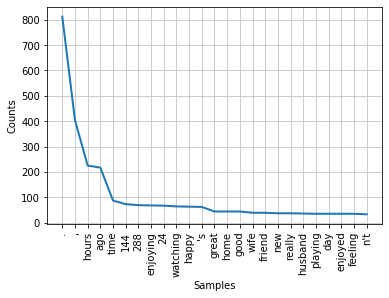

In [18]:
ert_word_freq.plot(25, cumulative = False)

### Show most frequent/common sentences in EFT Cues combined

Don't know if this helps, but still thought of trying it!

In [19]:
ert_sent_freq = nltk.FreqDist(ERT_filtered_sentence)
for i in ert_sent_freq.most_common(25):
    print(i)
    print("\n")

('About 144 hours ago I was watching a movie.', 2)


('I was by myself.', 2)


('I was with my wife.', 2)


('About 24 hours ago I was getting my 18 month old ready for bed.', 1)


('I was giving him a bath and then reading him several bed-time stories before putting him down for the night.', 1)


('I was very excited when he finally decided to tell me "night" before leaving the room.', 1)


('About 144 hours ago I was playing an online video game with my older brother.', 1)


('We were playing an exciting game titled "Rocket League."', 1)


('I was performing very well and we were doing great as a team.', 1)


('I was thrilled when I scored the final goal in overtime of our game.', 1)


("I couldn't believe it and my brother congratulated me for the win.", 1)


('About 288 hours ago I was out on a date with my wife.', 1)


('We first went to eat at Bonefish Grill.', 1)


('I had a delicious steak and my wife had a nice cut of tuna.', 1)


('We then went to see a movie at the theater.'

In [20]:
ert_dict = {}
eft_dict = {}
reduntant_words = ["I", ",", ".", "In", "about", "ago", "month", "months", "year", "week"]
for i in ert_word_freq.most_common(25):
    ert_word = i[0]
    
    if ert_word not in reduntant_words:
        ert_dict[ert_word] = []
        ert_dict[ert_word].append(i[1])

for i in word_freq.most_common(25):
    eft_word = i[0]
    
    if eft_word not in reduntant_words: 
        eft_dict[eft_word] = []
        eft_dict[eft_word].append(i[1])        

In [21]:
pd.DataFrame(list(ert_dict.items()), columns = ["ERT Words", "Frequency"])

,ERT Words,Frequency
0,hours,[225]
1,time,[87]
2,144,[73]
3,288,[69]
4,enjoying,[68]
5,24,[67]
6,watching,[64]
7,happy,[63]
8,'s,[62]
9,great,[44]


In [22]:
pd.DataFrame(list(eft_dict.items()), columns = ["EFT Words", "Frequencey"])

,EFT Words,Frequencey
0,1,[81]
1,'s,[67]
2,excited,[62]
3,enjoying,[60]
4,time,[59]
5,family,[57]
6,day,[55]
7,6,[54]
8,happy,[44]
9,feeling,[44]


In [23]:
temp = ert_dict
for key in eft_dict:
    if key in temp:
        temp[key].append(eft_dict[key][0])

In [24]:
together = pd.DataFrame(list(ert_dict.items()), columns = ["Common Words", "Frequencey"])
together

,Common Words,Frequencey
0,hours,[225]
1,time,"[87, 59]"
2,144,[73]
3,288,[69]
4,enjoying,"[68, 60]"
5,24,[67]
6,watching,[64]
7,happy,"[63, 44]"
8,'s,"[62, 67]"
9,great,"[44, 31]"


In [23]:
# data.columns
EFT

,EFT/ERT
0,EFT
1,EFT
2,EFT
3,EFT
4,EFT
5,EFT
6,EFT
7,EFT
8,EFT
9,EFT


In [24]:
all_cues

,cue_spellcheck
0,About 2 weeks from now I am visiting my husban...
1,"In 6 months, I am visiting my mother in law. S..."
2,In one year we are picking up my husband from ...
3,In 7 months I AM AT THE INN OF THE MOUNTAIN GO...
4,In 5 mins I will be at the July 4th fireworks ...
5,In about one year I will be in Las Vegas at th...
6,In about one month I will be on the beach with...
7,In about 6 months I will enjoy the museum. I a...
8,In about 1 year I will go to the Mountains. I ...
9,"In about one month I am at Beaufort, SC at the..."


In [46]:
time_cues = [(all_cues['cue_spellcheck'][i], EFT['EFT/ERT'][i]) for i in EFT.index]

In [47]:
time_cues

[('About 2 weeks from now I am visiting my husband in the state prison. I get to talk to him on the phone daily, but I have not gotten to see him in over a year. I am waiting for our tax check and I super excited about seeing him. My son and I are seeing him since we are the only ones allowed. We are driving almost 3 hours to be able to visit him for almost 4 hours.',
  'EFT'),
 ('In 6 months, I am visiting my mother in law. She is down visiting from Indiana. She is staying with us for a week. We have waited for her to come down for a long time because we have not seen her in years. We are ecstatic she is here and is visiting. The kids are excited that they finally get to see her. We are going shopping and doing other fun things while she is here. We are looking forward to all the excitement that happens while she is visiting.',
  'EFT'),
 ('In one year we are picking up my husband from jail. We have waited for this moment for so long. He is being released and he finally gets to come h

In [48]:
import random

In [73]:
random.shuffle(time_cues)
all_words = []
for words in filtered_words:
    all_words.append(words)

for words in ERT_filtered_words:
    all_words.append(words)
    
# all_words.append(filtered_words)
# all_words.append(ERT_filtered_words)
len(all_words)

19124

In [71]:
all_words = nltk.FreqDist(all_words)
word_features = list(all_words.keys())[:3000]
word_features

['God',
 'pm',
 'relieve',
 'point',
 'feed',
 'Charlie',
 'SITS',
 'runs',
 'errands',
 'follow',
 'awe',
 'evening.My',
 'mirror',
 'tiny',
 'occur',
 'league',
 'arms',
 'talks',
 'owns',
 'college',
 'whole',
 'Initially',
 'determinedand',
 'selecting',
 'shift',
 'shopping',
 'Laurel',
 'bills.I',
 'Norther',
 'Daily',
 'checking',
 '8.00',
 'summit',
 'eye',
 'party.The',
 'Oranges',
 'cost',
 'handed',
 'Robert',
 'health',
 'seeing',
 'Italian',
 'DePaul',
 'kidding',
 'Brooks',
 'upper',
 'black',
 'press',
 'there.There',
 'thrilled',
 'pastry',
 '280',
 'pepperoni',
 'kiss.I',
 'anticipated',
 'stay',
 'irritated',
 'dunes.I',
 'traveled',
 'displayed',
 'happy.I',
 'Blue',
 'meals',
 '370Z',
 'crying',
 'orange',
 'driving',
 'girl',
 'Michael',
 'drank',
 'peace.I',
 'audiobook.It',
 'different',
 'department',
 'city',
 'Drone',
 'continuing',
 'haunted',
 'Bangkok',
 'Daytona',
 'finished',
 'relatives',
 'Civic',
 'carrying',
 'remembering',
 'vacation.I',
 'Grease',
 

In [64]:
def find_features(each_cue):
    words = set(each_cue)
    features = {}
    for w in word_features:
        features[w] = (w in words)
    
    return features

In [65]:
# print(find_features(Filtered_words))

In [70]:
featuresets = [(find_features(cues), category) for (cues, category) in time_cues]
featuresets

[({'God': False,
   'tide': False,
   'pm': False,
   'lean': False,
   'relieve': False,
   'salesman': False,
   'months': False,
   'desk': False,
   'feed': False,
   'Charlie': False,
   'SITS': False,
   'camaraderie.I': False,
   'runs': False,
   'errands': False,
   'calm': False,
   'awe': False,
   'filing': False,
   'mirror': False,
   'relieved': False,
   'stressful': False,
   'gives': False,
   'Eagle': False,
   'tiny': False,
   'darts': False,
   'We': False,
   'overcome': False,
   'encourage': False,
   'league': False,
   'arms': False,
   'talks': False,
   'owns': False,
   'college': False,
   'whole': False,
   'funny': False,
   'dropped': False,
   'attempted': False,
   'determinedand': False,
   'selecting': False,
   'shift': False,
   'shopping': False,
   'Laurel': False,
   'bills.I': False,
   'Norther': False,
   'flowing': False,
   'Daily': False,
   'checking': False,
   'win': False,
   'summit': False,
   'Red': False,
   'eye': False,
   'par

### Trying Naive Bayes

In [67]:
training_set = featuresets[:1900]
# print(training_set)
testing_set = featuresets[1900:]

In [68]:
classifier = nltk.NaiveBayesClassifier.train(training_set)
print("Naive Bayes Classifier Accuracy: ", nltk.classify.accuracy(classifier, testing_set)*100)

Naive Bayes Classifier Accuracy:  0


In [69]:
classifier.show_most_informative_features(50)

Most Informative Features
                       8 = True              ERT : EFT    =     49.6 : 1.0
                       A = False             EFT : ERT    =     24.5 : 1.0
                       4 = True              ERT : EFT    =     13.4 : 1.0
                       2 = True              ERT : EFT    =      7.3 : 1.0
                       A = True              ERT : EFT    =      4.9 : 1.0
                       ) = True              ERT : EFT    =      3.2 : 1.0
                       ( = True              ERT : EFT    =      3.2 : 1.0
                       4 = False             EFT : ERT    =      2.6 : 1.0
                       2 = False             EFT : ERT    =      2.6 : 1.0
                       : = True              ERT : EFT    =      2.3 : 1.0
                       ; = True              ERT : EFT    =      2.3 : 1.0
                       - = True              ERT : EFT    =      2.0 : 1.0
                       5 = True              ERT : EFT    =      1.6 : 1.0